<a href="https://colab.research.google.com/github/restuprtma/PCVK_Ganjil_2025/blob/main/PCVK_Modul3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Modul 3
##Simple Image Operations – Linear Brightness, Contrast, Inverse, Logarithmic Brightness , and Grayscale Image

##Step 1
Akses folder images pada Google Drive

In [ ]:
from google.colab import drive

#Accessing My google drive
drive.mount('/content/drive')

##Step 2
Import Library CV dan numpy

In [2]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow

##Step 3
Transformasi Linier Brightness

 Mengubah tingkat kecerahan citra 
------------------------------------
Masukkan nilai kecerahan: 45


/tmp/ipython-input-3033169127.py:26: RuntimeWarning: overflow encountered in scalar add
  brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)


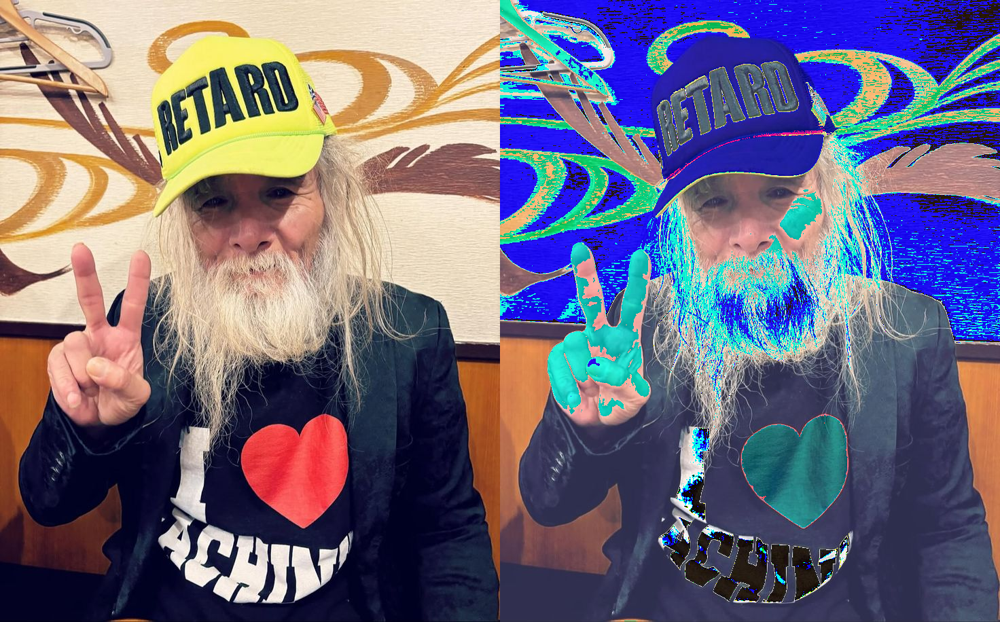

In [3]:
import os

print(' Mengubah tingkat kecerahan citra ')
print('------------------------------------')
try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')

image_path = '/content/drive/MyDrive/PCVK/Image/simbah.jpeg'

if not os.path.exists(image_path):
    print(f"Error: Image file not found at {image_path}")
else:
    original = cv.imread(image_path)

    if original is None:
        print(f"Error: Could not load image from {image_path}. Check if the file is a valid image.")
    else:
        brightness_image = np.zeros(original.shape, original.dtype)

        #akses per piksel
        for y in range(original.shape[0]):
            for x in range(original.shape[1]):
                for c in range(original.shape[2]):
                    brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)

        #cara simple tanpa for loop
        #brightness_image = cv.convertScaleAbs(original, beta=brightness)

        final_frame = cv.hconcat((original, brightness_image))
        cv2_imshow(final_frame)

##Task

###1. Implementasikan inverse citra pada Google Colaboratory menggunakan formula yang terdapat pada bagian Ulasan Teori, sehingga menghasilkan keluaran seperti berikut:

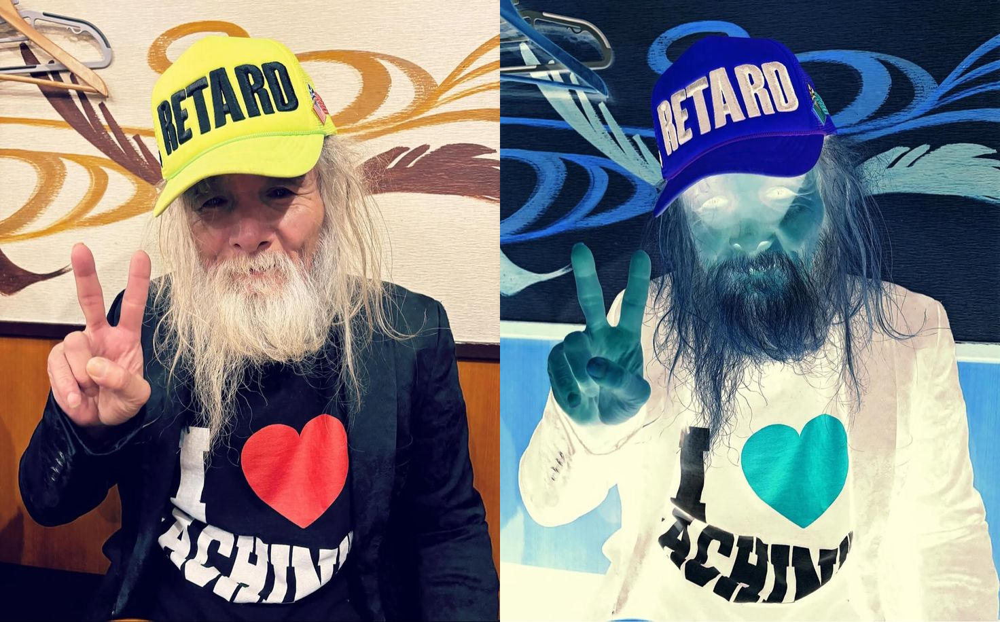

In [4]:
image_inverse = original.copy()
image_inversed = 255 - image_inverse
final_frame = cv.hconcat((image_inverse, image_inversed))

cv2_imshow(final_frame)

###2. Implementasikan transformasi contrast pada Google Colaboratory menggunakan formula yang terdapat pada bagian Ulasan Teori untuk kontras, sehingga menghasilkan keluaran seperti berikut:

Masukkan kontras[1.0 - 3.0]:2.0


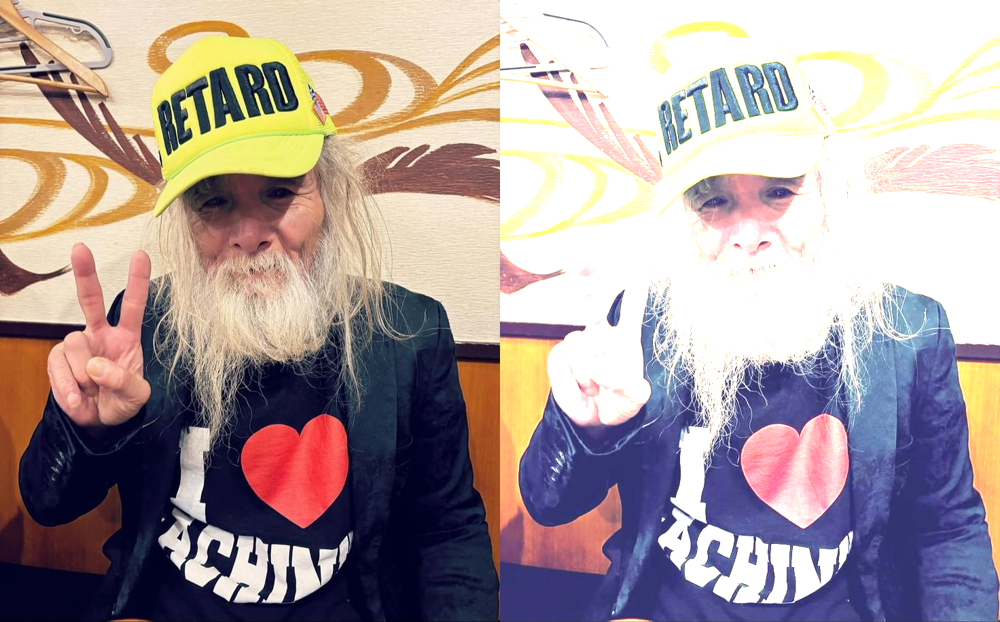

In [5]:
kontras_img = original.copy()
try:
  bright = int(input('Masukkan nilai kecerahan[-255 - 255]:'))
  kontrs = float(input('Masukkan kontras[1.0 - 3.0]:'))
except ValueError:
  print('Error, NaN')

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      kontras_img[y,x,c] = np.clip(kontrs * original[y,x,c] + bright, 0, 255)

frame_kontras = cv.hconcat((original, kontras_img))
cv2_imshow(frame_kontras)

###3. Implementasikan transformasi logarithmic brightness pada Google Colaboratory menggunakan formula yang terdapat pada bagian Ulasan Teori untuk transformasi log, sehingga menghasilkan keluaran seperti berikut:

mengubah tingkat kecerahan logaritmic log
--------------------------------
Masukkan nilai kecerahan:25


/tmp/ipython-input-3003741044.py:17: RuntimeWarning: overflow encountered in scalar add
  s = c * np.log(1 + r)   # rumus logaritmik
/tmp/ipython-input-3003741044.py:17: RuntimeWarning: divide by zero encountered in log
  s = c * np.log(1 + r)   # rumus logaritmik


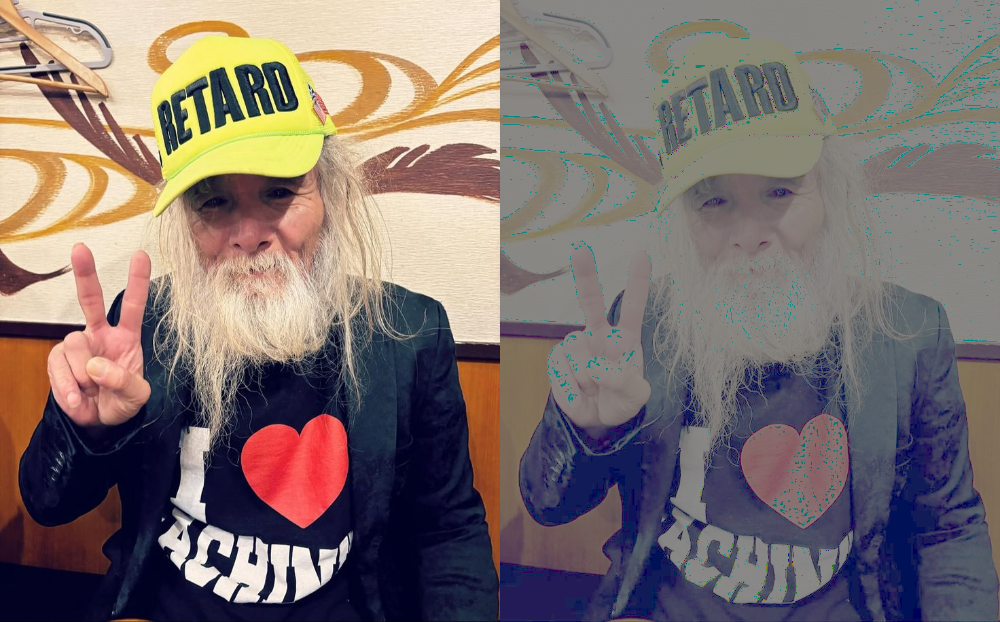

In [6]:
print('mengubah tingkat kecerahan logaritmic log')
print('--------------------------------')

try:
  brightnes = int(input('Masukkan nilai kecerahan:'))
except ValueError:
  print('Error, NaN')

brightnes_img = np.zeros(original.shape, original.dtype)

# transformasi logaritmik
c = brightnes
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for ch in range(original.shape[2]):
            r = original[y, x, ch]
            s = c * np.log(1 + r)   # rumus logaritmik
            brightnes_img[y, x, ch] = np.clip(s, 0, 255)


final_cerah_log = cv.hconcat((original, brightnes_img))
cv2_imshow(final_cerah_log)

###4. Implementasikan transformasi grayscale menggunakan metode averaging, lightness,dan luminance pada Google Colaboratory menggunakan formula yang terdapat pada bagian Ulasan Teori

####Averaging

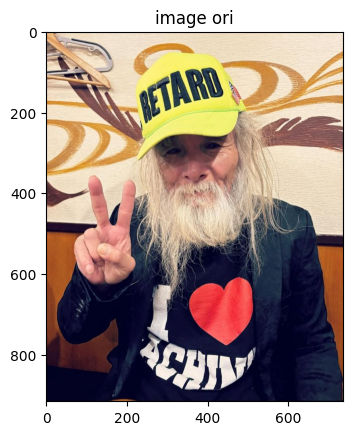

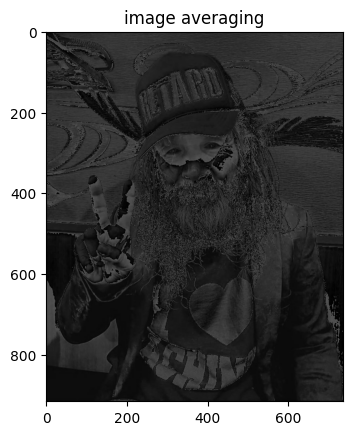

In [7]:
copyorigin = cv.cvtColor(original, cv.COLOR_BGR2RGB)
avg_img = copyorigin.copy()
array_img = np.asarray(avg_img)
r = array_img[:, :, 0]
g = array_img[:, :, 1]
b = array_img[:, :, 2]

gray_avg = (r + g + b) / 3
avg_img[:, :, 0] = gray_avg
avg_img[:, :, 1] = gray_avg
avg_img[:, :, 2] = gray_avg

plt.imshow(copyorigin)
plt.title('image ori')
plt.show()
plt.imshow(avg_img)
plt.title('image averaging')
plt.show()

####Lightness

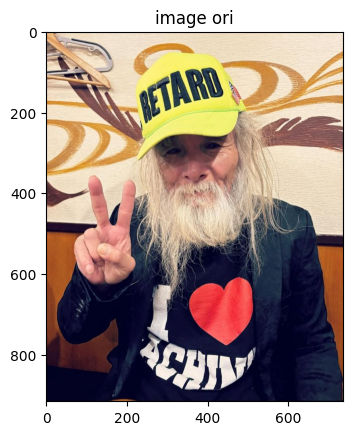

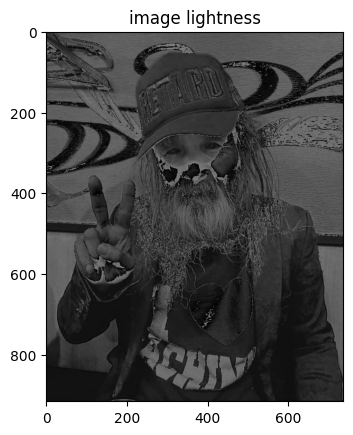

In [8]:
copyorigin = cv.cvtColor(original, cv.COLOR_BGR2RGB)
lightness_img = copyorigin.copy()
array_img = np.asarray(lightness_img)
r = array_img[:, :, 0]
g = array_img[:, :, 1]
b = array_img[:, :, 2]

gray_lightness = ((array_img.max(axis=2) + array_img.min(axis=2)) / 2)

lightness_img[:, :, 0] = gray_lightness
lightness_img[:, :, 1] = gray_lightness
lightness_img[:, :, 2] = gray_lightness


plt.imshow(copyorigin)
plt.title('image ori')
plt.show()
plt.imshow(lightness_img)
plt.title('image lightness')
plt.show()


####Luminance

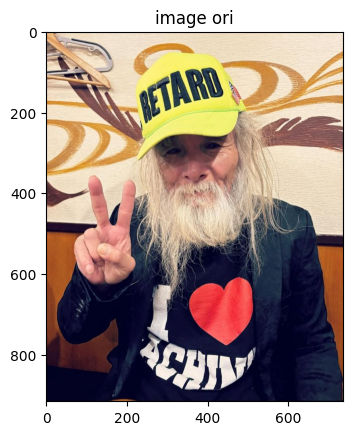

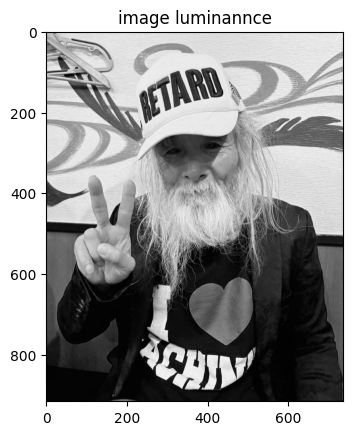

In [9]:
luminanceImg = copyorigin.copy()
array_img = np.asarray(luminanceImg)
r = array_img[:, :, 0]
g = array_img[:, :, 1]
b = array_img[:, :, 2]

gray_lumi = (0.21*r) + (0.72*g) + (0.07*b)

luminanceImg[:, :, 0] = gray_lumi
luminanceImg[:, :, 1] = gray_lumi
luminanceImg[:, :, 2] = gray_lumi


plt.imshow(copyorigin)
plt.title('image ori')
plt.show()
plt.imshow(luminanceImg)
plt.title('image luminannce')
plt.show()

###5. Tampilkanlah warna tertentu pada citra, dan ubah warna lain menjadi grayscale. Misal, tampilkan warna biru pada citra masukan dan ubah bagian lain yang tidak berwarna biru menjadi grayscale seperti pada contoh berikut:

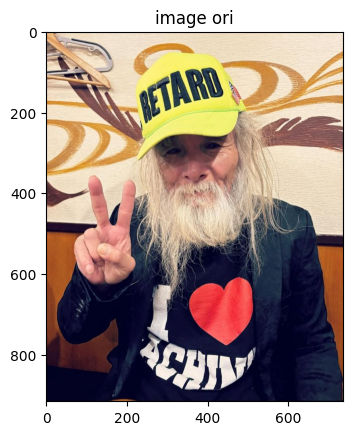

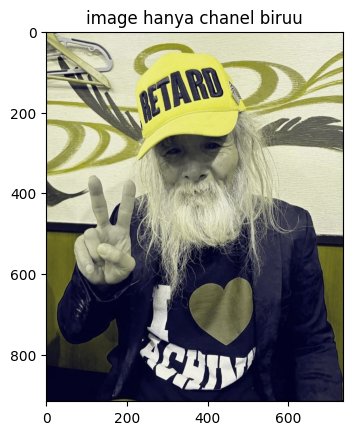

In [10]:
blue_img = copyorigin.copy()
array_img = np.asarray(blue_img)
r = array_img[:, :, 0]
g = array_img[:, :, 1]
b = array_img[:, :, 2]

gray_lumi = (0.21*r) + (0.72*g) + (0.07*b)

blue_img[:, :, 0] = gray_lumi
blue_img[:, :, 1] = gray_lumi

plt.imshow(copyorigin)
plt.title('image ori')
plt.show()
plt.imshow(blue_img)
plt.title('image hanya chanel biruu')
plt.show()